<a href="https://colab.research.google.com/github/utkarshsharma1/face_mask_detection/blob/master/Face_mask_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Check results from the third part (Testing)

# Face mask detection

We have a wonderful dataset on kaggle. It can be found on https://www.kaggle.com/vtech6/medical-masks-dataset.
The following dataset contains pictures of people wearing medical masks along with XML files containing their descriptions.

There are 682 images with over 3000 faces wearing masks and around 700 masks worn either wrongly or not worn at all. The XML files contain their locations and labels *good*, *none* or *bad*.

The dataset comes from Eden Social Welfare Foundation, Taiwan.

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive
/gdrive


#Visualizing image

Reference: https://www.kaggle.com/vtech6/medical-masks-dataset/kernels.

It draws a bouding box with different colors according to the labels.
Green corresponds to 'good', red to 'bad', blue to 'none'.

In [ ]:
!pip install xmltodict
import os
import cv2
import matplotlib.pyplot as plt
import xmltodict
import random

In [ ]:
def get_path(image_name):
    home_path = '/gdrive/My Drive/mask kaggle'
    image_path = os.path.join(home_path , 'images', image_name)
    
    #Some images have .jpeg and some have .jpg extension
    if image_name[-4:] == 'jpeg':
        label_name = image_name[:-5] + '.xml'
    else:
        label_name = image_name[:-4] + '.xml'
    
    label_path = os.path.join(home_path, 'labels', label_name)
        
    return  image_path, label_path

In [ ]:
def parse_xml(label_path):
    x = xmltodict.parse( open( label_path , 'rb'))
    item_list = x['annotation']['object']
    
    # when image has only one bounding box
    if not isinstance(item_list, list):
        item_list = [item_list]
        
    result = []
    
    for item in item_list:
        name = item['name']
        bndbox = [(int(item['bndbox']['xmin']), int(item['bndbox']['ymin'])),
                  (int(item['bndbox']['xmax']), int(item['bndbox']['ymax']))] 

        result.append((name, bndbox))

    return result

In [ ]:
def visualize_image(image_name, bndbox=True):

    image_path, label_path = get_path(image_name)
    
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    if bndbox:
        labels = parse_xml(label_path)

        for label in labels:
            name, bndbox = label
            
            if name == 'good':
                cv2.rectangle(image, bndbox[0], bndbox[1], (0, 255, 0), thickness = 3)
            elif name == 'bad':
                cv2.rectangle(image, bndbox[0], bndbox[1], (255, 0, 0), thickness = 3)
            else: # name == 'none'
                cv2.rectangle(image, bndbox[0], bndbox[1], (0, 0, 255), thickness = 3)
    
    plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.title(image_name)
    plt.imshow(image)
    plt.show()

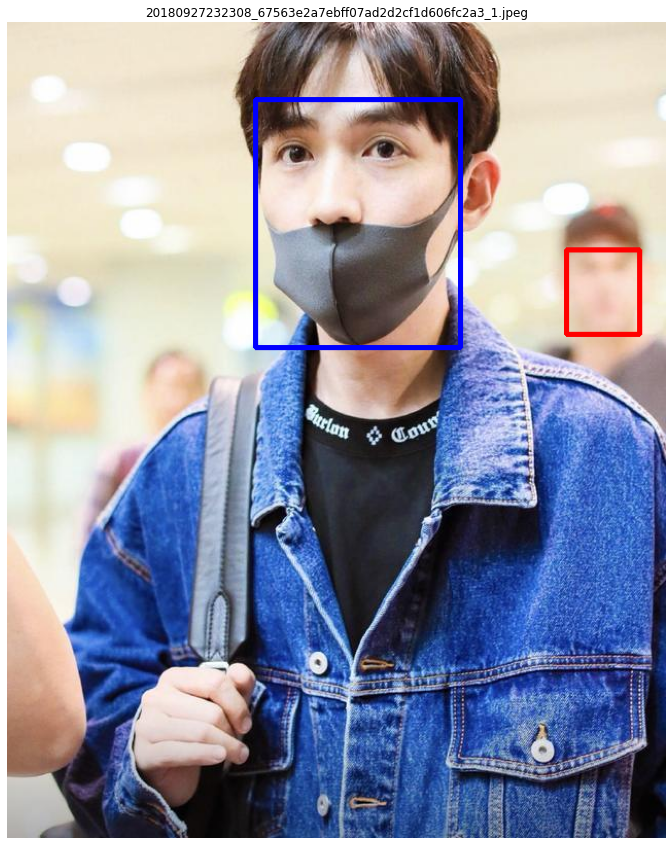

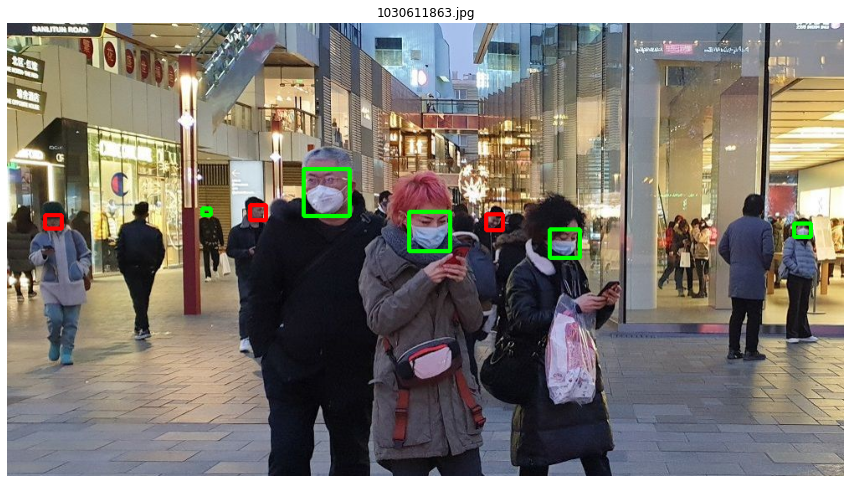

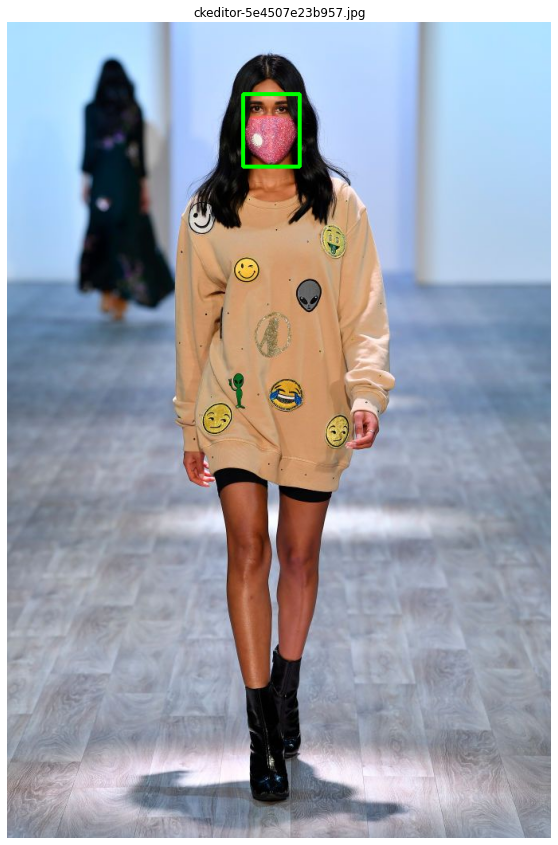

In [ ]:
name_list = os.listdir('/gdrive/My Drive/mask kaggle/images')
names = random.sample(name_list, 3)

for name in names:
    visualize_image(name)

# Cropping data

In [ ]:
from imutils import paths
from tqdm import tqdm
import numpy as np

from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img

from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import classification_report

In [ ]:
def cropImage(image_name):

    image_path, label_path = get_path(image_name)
    
    image = cv2.imread(image_path)
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    labels = parse_xml(label_path)
    
    cropedImgLabels = []

    for label in labels:
        name, bndbox = label
         
        croped_image = image[bndbox[0][1]:bndbox[1][1], bndbox[0][0]:bndbox[1][0]]
        label_num = 0
        
        if name == "good":
            label_num = 0
        elif name == "bad":
            label_num = 1
        else:
            label_num = 2
        
        cropedImgLabel = [croped_image, label_num]
        cropedImgLabels.append(cropedImgLabel)
        
    return cropedImgLabels

In [ ]:
# Creating directories for all these croped images
dir_name = '/gdrive/My Drive/mask kaggle/train'
label_0_dir = os.path.join(dir_name,'0')
label_1_dir = os.path.join(dir_name,'1')
label_2_dir = os.path.join(dir_name,'2')

models_dir = '/gdrive/My Drive/mask kaggle/models'

if not(os.path.exists(dir_name)):
    os.mkdir(dir_name)
    os.mkdir(label_0_dir)
    os.mkdir(label_1_dir)
    os.mkdir(label_2_dir)
if not(os.path.exists(models_dir)):
    os.mkdir(models_dir)

In [ ]:
label_0_counter = 0
label_1_counter = 0
label_2_counter = 0

for image_name in tqdm(name_list):
    cropedImgLabels = cropImage(image_name)
    
    for cropedImgLabel in cropedImgLabels:
        
        img = cropedImgLabel[0]
        label = cropedImgLabel[1]
        
        if label == 0:
            croped_img_name = str(label_0_counter) + ".jpg"
            cv2.imwrite(os.path.join(label_0_dir, croped_img_name), img)
            label_0_counter += 1
        elif label == 1:
            croped_img_name = str(label_1_counter) + ".jpg"
            cv2.imwrite(os.path.join(label_1_dir, croped_img_name), img)
            label_1_counter += 1
        else:
            croped_img_name = str(label_2_counter) + ".jpg"
            cv2.imwrite(os.path.join(label_2_dir, croped_img_name), img)
            label_2_counter += 1

100%|██████████| 678/678 [24:48<00:00,  2.20s/it]


I renamed the directories to mask & without_mask

In [ ]:
images_dir = os.listdir(dir_name)
images_dir

['mask', 'without_mask']

In [ ]:
filenames_label_0 = os.listdir(os.path.join(dir_name, images_dir[0]))
filenames_label_1 = os.listdir(os.path.join(dir_name, images_dir[1]))

In [ ]:
print("Total number of images: ", len(filenames_label_0) + len(filenames_label_1))
print("Number of images labeled 0: ", len(filenames_label_0))
print("Number of images labeled 1: ", len(filenames_label_1))

Total number of images:  5164
Number of images labeled 0:  3811
Number of images labeled 1:  1353


In [ ]:
print("Total number of images: ", len(filenames_label_0) + len(filenames_label_1) + len(filenames_label_2))
print("Number of images labeled 0: ", len(filenames_label_0))
print("Number of images labeled 1: ", len(filenames_label_1))
print("Number of images labeled 2: ", len(filenames_label_2))

# Loading data

In [ ]:
# grab the list of images in our dataset directory, then initialize
# the list of data (i.e., images) and class images
print("[INFO] loading images...")
imagePaths = list(paths.list_images(dir_name))
data = []
labels = []

# loop over the image paths
for imagePath in tqdm(imagePaths):

	# extract the class label from the filename
	label = imagePath.split(os.path.sep)[-2]

	# load the input image (224x224) and preprocess it
	image = load_img(imagePath, target_size=(224, 224))
	image = img_to_array(image)
	image = preprocess_input(image)
 
	# update the data and labels lists, respectively
	data.append(image)
	labels.append(label)
# convert the data and labels to NumPy arrays
data = np.array(data, dtype="float32")
labels = np.array(labels)

[INFO] loading images...


100%|██████████| 5164/5164 [00:19<00:00, 259.26it/s]


In [ ]:
print(data.shape, labels.shape)
print(np.unique(labels))

(5164, 224, 224, 3) (5164,)
['mask' 'without_mask']


In [ ]:
# perform one-hot encoding on the labels
lb = LabelBinarizer()
labels_2 = lb.fit_transform(labels)
labels_3 = to_categorical(labels_2)

# partition the data into training and testing splits using 80% of
# the data for training and the remaining 20% for testing
(trainX, testX, trainY, testY) = train_test_split(data, labels_3,
                        	test_size=0.20, stratify = labels, random_state=42)

# construct the training image generator for data augmentation
aug = ImageDataGenerator(
	rotation_range=20,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
	fill_mode="nearest")

In [ ]:
# load the MobileNetV2 network, ensuring the head FC layer sets are
# left off
baseModel = MobileNetV2(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))

# construct the head of the model that will be placed on top of the
# the base model
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)

# place the head FC model on top of the base model (this will become
# the actual model we will train)
model = Model(inputs=baseModel.input, outputs=headModel)

# loop over all layers in the base model and freeze them so they will
# *not* be updated during the first training process
for layer in baseModel.layers:
	layer.trainable = False

9412608/9406464 [==============================] - 0s 0us/step


In [ ]:
# initialize the initial learning rate, number of epochs to train for,
# and batch size
INIT_LR = 1e-4
EPOCHS = 20
BS = 32         #Batch size

In [ ]:
# compile our model
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)

model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])

# train the head of the network
print("[INFO] training head...")
H = model.fit(
            aug.flow(trainX, trainY, batch_size=BS),
            steps_per_epoch=len(trainX) // BS,
            validation_data=(testX, testY),
            validation_steps=len(testX) // BS,
            epochs=EPOCHS)

[INFO] compiling model...
[INFO] training head...
Epoch 1/20
129/129 [==============================] - 48s 375ms/step - loss: 0.4521 - accuracy: 0.8021 - val_loss: 0.2515 - val_accuracy: 0.9051
Epoch 2/20
129/129 [==============================] - 47s 362ms/step - loss: 0.2732 - accuracy: 0.8812 - val_loss: 0.2116 - val_accuracy: 0.9042
Epoch 3/20
129/129 [==============================] - 47s 363ms/step - loss: 0.2227 - accuracy: 0.9063 - val_loss: 0.2109 - val_accuracy: 0.9119
Epoch 4/20
129/129 [==============================] - 47s 365ms/step - loss: 0.2113 - accuracy: 0.9049 - val_loss: 0.1926 - val_accuracy: 0.9080
Epoch 5/20
129/129 [==============================] - 47s 365ms/step - loss: 0.1967 - accuracy: 0.9122 - val_loss: 0.1773 - val_accuracy: 0.9177
Epoch 6/20
129/129 [==============================] - 47s 366ms/step - loss: 0.1969 - accuracy: 0.9158 - val_loss: 0.1713 - val_accuracy: 0.9138
Epoch 7/20
129/129 [==============================] - 47s 366ms/step - loss: 0.1

In [ ]:
# make predictions on the testing set
print("[INFO] evaluating network...")
predIdxs = model.predict(testX, batch_size=BS)

# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)

# show a nicely formatted classification report
print(classification_report(testY.argmax(axis=1), predIdxs, target_names=lb.classes_))

# serialize the model to disk
print("[INFO] saving mask detector model...")
model.save('/gdrive/My Drive/Another_mask/second', save_format="h5")

[INFO] evaluating network...
              precision    recall  f1-score   support

        mask       0.92      0.99      0.95       762
without_mask       0.95      0.77      0.85       271

    accuracy                           0.93      1033
   macro avg       0.94      0.88      0.90      1033
weighted avg       0.93      0.93      0.93      1033

[INFO] saving mask detector model...


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
______________________________________________________________________________________________

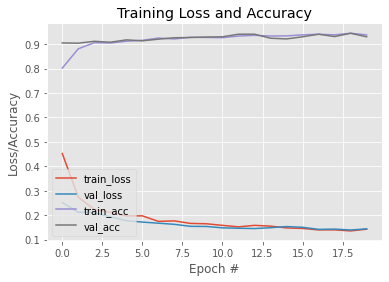

In [ ]:
# plot the training loss and accuracy
N = EPOCHS
plt.style.use("ggplot")
plt.figure()

plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")

plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")

# Testing CaffeModel

In [ ]:
# import the necessary packages
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
import numpy as np
import argparse
import cv2
from google.colab.patches import cv2_imshow
import os

In [ ]:
# load the face mask detector model from disk
print("[INFO] loading face mask detector model...")
model = load_model('/gdrive/My Drive/Another_mask/second')

# load our serialized face detector model from disk
print("[INFO] loading face detector model...")

prototxtPath = '/gdrive/My Drive/Another_mask/Face_stor/deploy.prototxt'
weightsPath = '/gdrive/My Drive/Another_mask/Face_stor/res10_300x300_ssd_iter_140000.caffemodel'

net = cv2.dnn.readNet(prototxtPath, weightsPath)


[INFO] loading face mask detector model...
[INFO] loading face detector model...


In [ ]:
# loop over the detections
def caffemodel(image, detections):
	for i in range(0, detections.shape[2]):
		# extract the confidence (i.e., probability) associated with
		# the detection
		confidence = detections[0, 0, i, 2]
		# filter out weak detections by ensuring the confidence is
		# greater than the minimum confidence
		if confidence > 0.14:
			# compute the (x, y)-coordinates of the bounding box for
			# the object
			box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
			(startX, startY, endX, endY) = box.astype("int")
	
			# ensure the bounding boxes fall within the dimensions of
			# the frame
			(startX, startY) = (max(0, startX), max(0, startY))
			(endX, endY) = (min(w - 1, endX), min(h - 1, endY))
	
			# extract the face ROI, convert it from BGR to RGB channel
			# ordering, resize it to 224x224, and preprocess it
			face = image[startY:endY, startX:endX]
			face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
			face = cv2.resize(face, (224, 224))
			face = img_to_array(face)
			face = preprocess_input(face)
			face = np.expand_dims(face, axis=0)
	
			# pass the face through the model to determine if the face
			# has a mask or not
			(mask, withoutMask) = model.predict(face)[0]

			# determine the class label and color we'll use to draw
			# the bounding box and text
			label = "Mask" if mask > withoutMask else "No Mask"
			color = (0, 255, 0) if label == "Mask" else (0, 0, 255)
			# include the probability in the label
			label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)
	
			# display the label and bounding box rectangle on the output
			# frame
			cv2.putText(image, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)
			cv2.rectangle(image, (startX, startY), (endX, endY), color, 2)
	
	# show the output image
	cv2_imshow(image)
	return image
#cv2.imwrite('/gdrive/My Drive/Another_mask/sol1_caffeModel.jpg', image)

[INFO] computing face detections...
(1, 1, 200, 7)


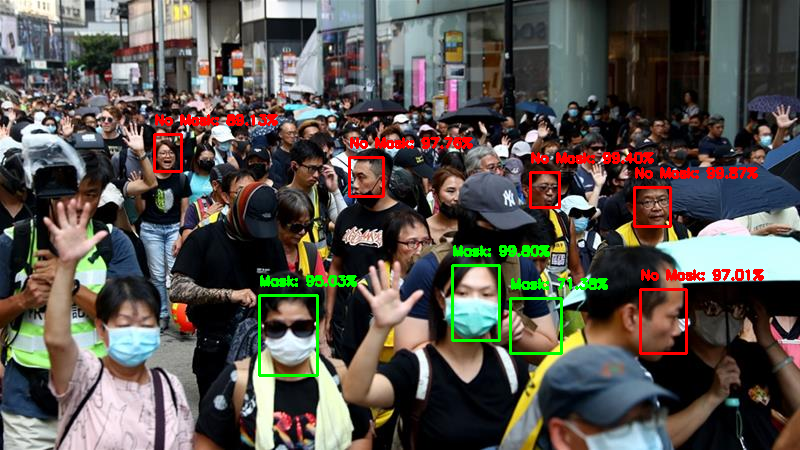

In [ ]:
# load the input image from disk, clone it, and grab the image spatial
# dimensions
image = cv2.imread('/gdrive/My Drive/Another_mask/another mask image.jpg')
orig = image.copy()
(h, w) = image.shape[:2]

# construct a blob from the image
blob = cv2.dnn.blobFromImage(image, 1.0, (300, 300), (104.0, 177.0, 123.0))

# pass the blob through the network and obtain the face detections
print("[INFO] computing face detections...")
net.setInput(blob)
detections = net.forward()
print(detections.shape)

frame = caffemodel(image , detections)

[INFO] computing face detections...
(1, 1, 200, 7)


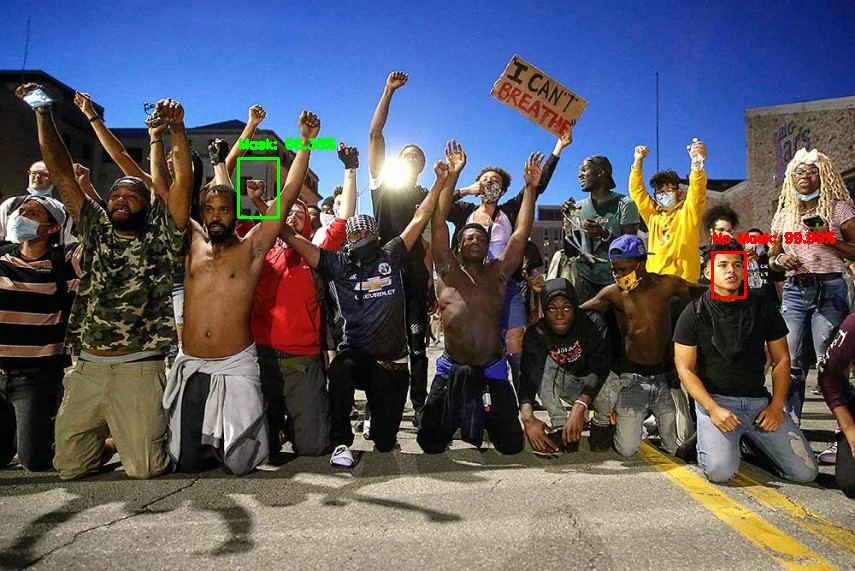

In [ ]:
# load the input image from disk, clone it, and grab the image spatial
# dimensions
image = cv2.imread('/gdrive/My Drive/Another_mask/Protests_1_20200530_571_855.jpg')
orig = image.copy()
(h, w) = image.shape[:2]

# construct a blob from the image
blob = cv2.dnn.blobFromImage(image, 1.0, (300, 300), (104.0, 177.0, 123.0))

# pass the blob through the network and obtain the face detections
print("[INFO] computing face detections...")
net.setInput(blob)
detections = net.forward()
print(detections.shape)

frame = caffemodel(image , detections)

#Face recognition
https://github.com/ageitgey/face_recognition

In [ ]:
!pip install face_recognition
import face_recognition
from PIL import Image
import numpy as np

     |████████████████████████████████| 100.2MB 41kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566172 sha256=ab8c92042f826a3aca64de8a36ad60b67632512bb7745f83b4f5edc8c8c8ddfc
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


In [ ]:

def detect_dlib(image, face_locations):
    print("I found {} face(s) in this photograph.".format(len(face_locations)))
    frame = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

    for face_location in face_locations:

        # Print the location of each face in this image
        top, right, bottom, left = face_location

        face = frame[top:bottom, left:right]
        face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
        face = cv2.resize(face, (224, 224))
        face = img_to_array(face)
        face = preprocess_input(face)
        face = np.expand_dims(face, axis=0)

        # pass the face through the model to determine if the face
        # has a mask or not
        (mask, withoutMask) = model.predict(face)[0]

        # determine the class label and color we'll use to draw
        # the bounding box and text
        label = "Mask" if mask > withoutMask else "No Mask"
        color = (0, 255, 0) if label == "Mask" else (0, 0, 255)
        # include the probability in the label
        label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

        # display the label and bounding box rectangle on the output
        # frame
        cv2.putText(frame, label, (left, top - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)

        # You can access the actual face itself like this:
        cv2.rectangle(frame, (left, top), (right, bottom), color, 2)
        #face_image = image[top:bottom, left:right]
        print(label)
        #pil_image = Image.fromarray(face_image)
        #cv2_imshow(cv2.cvtColor(np.array(pil_image), cv2.COLOR_RGB2BGR))
    cv2_imshow(frame)
    return frame

USing CNN, enhanced version of face_recognition
I found 8 face(s) in this photograph.
No Mask: 99.85%
No Mask: 98.98%
Mask: 69.73%
Mask: 89.90%
No Mask: 85.95%
Mask: 64.19%
No Mask: 99.79%
No Mask: 99.29%


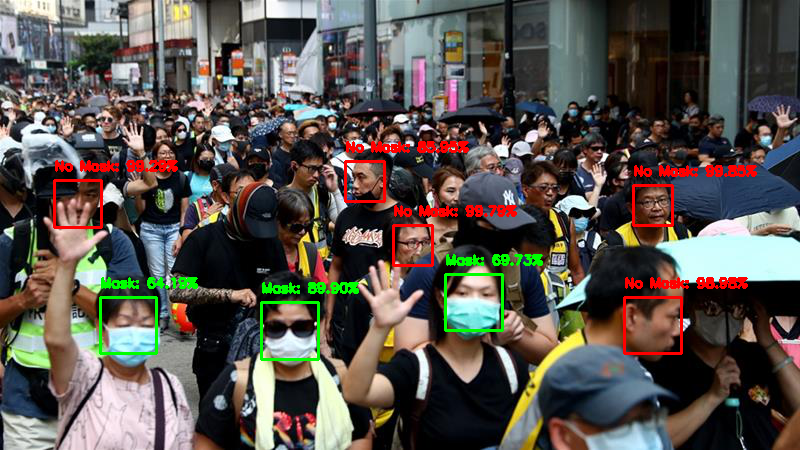

In [ ]:
print("USing CNN, enhanced version of face_recognition")
frame = '/gdrive/My Drive/Another_mask/another mask image.jpg'

image = face_recognition.load_image_file(frame)

face_locations = face_recognition.face_locations(image, model="cnn")

frame = detect_dlib(image, face_locations)
#cv2.imwrite('/gdrive/My Drive/Another_mask/sol2_face_recognition_cnn.jpg', frame)

Normal version
I found 3 face(s) in this photograph.
No Mask: 97.86%
No Mask: 99.90%
No Mask: 99.54%


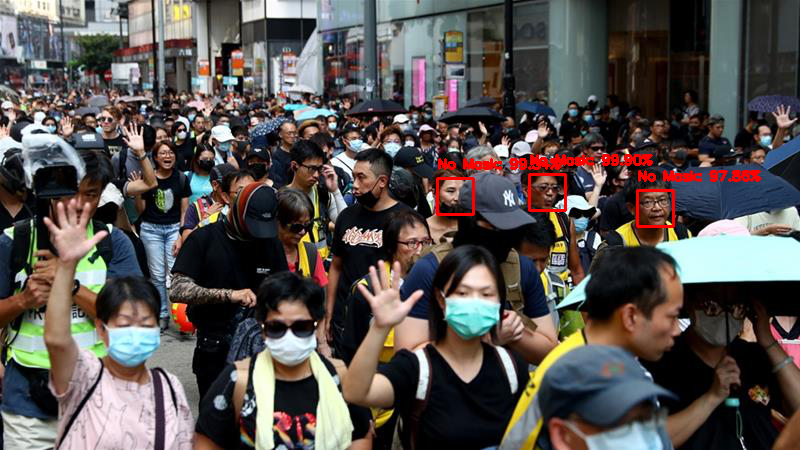

In [ ]:
print('Normal version')
frame = '/gdrive/My Drive/Another_mask/another mask image.jpg'

image = face_recognition.load_image_file(frame)

face_locations = face_recognition.face_locations(image)

frame = detect_dlib(image, face_locations)

USing CNN, enhanced version of face_recognition
I found 3 face(s) in this photograph.
No Mask: 100.00%
No Mask: 99.38%
No Mask: 99.31%


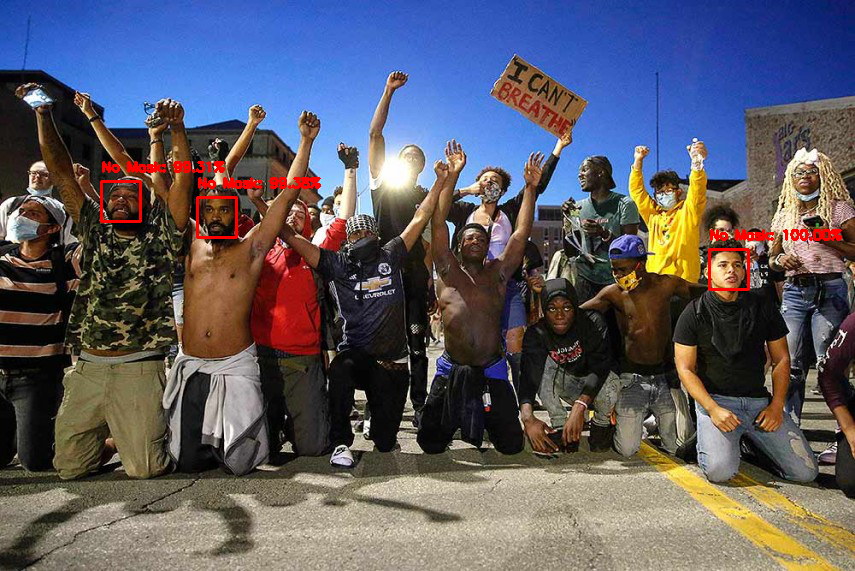

In [ ]:
print("USing CNN, enhanced version of face_recognition")
frame = '/gdrive/My Drive/Another_mask/Protests_1_20200530_571_855.jpg'

image = face_recognition.load_image_file(frame)

face_locations = face_recognition.face_locations(image, model="cnn")

frame = detect_dlib(image, face_locations)

Normal Version
I found 3 face(s) in this photograph.
No Mask: 99.94%
No Mask: 99.91%
No Mask: 99.18%


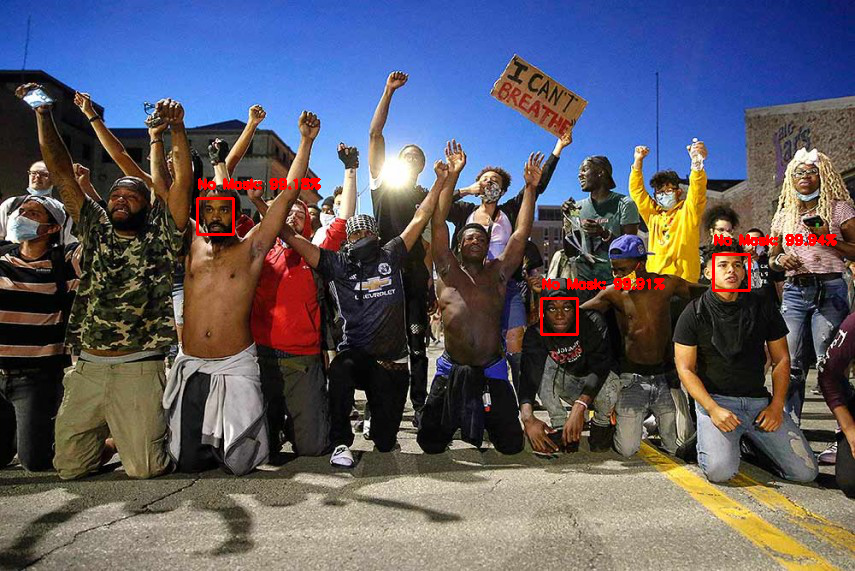

In [ ]:
print("Normal Version")
frame = '/gdrive/My Drive/Another_mask/Protests_1_20200530_571_855.jpg'

image = face_recognition.load_image_file(frame)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
face_locations = face_recognition.face_locations(gray)

frame = detect_dlib(image, face_locations)

# Haar Cascade frontal face

It only detects front faces

In [ ]:
def haar_cascade(frame, faces):
    for (x, y, w, h) in faces:

        face = frame[y:y+h, x:x+w]
        face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
        face = cv2.resize(face, (224, 224))
        face = img_to_array(face)
        face = preprocess_input(face)
        face = np.expand_dims(face, axis=0)

        # pass the face through the model to determine if the face
        # has a mask or not
        (mask, withoutMask) = model.predict(face)[0]

        # determine the class label and color we'll use to draw
        # the bounding box and text
        label = "Mask" if mask > withoutMask else "No Mask"
        color = (0, 255, 0) if label == "Mask" else (0, 0, 255)
        # include the probability in the label
        label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

        # display the label and bounding box rectangle on the output
        # frame
        cv2.putText(frame, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)
        cv2.rectangle(frame, (x, y), (x+w, y+h), color, 2)
        print(x, y, w, h)
        print(label)

    cv2_imshow(frame)
    return frame

(2, 4)
443 270 65 65
Mask: 93.66%
251 299 80 80
Mask: 99.59%


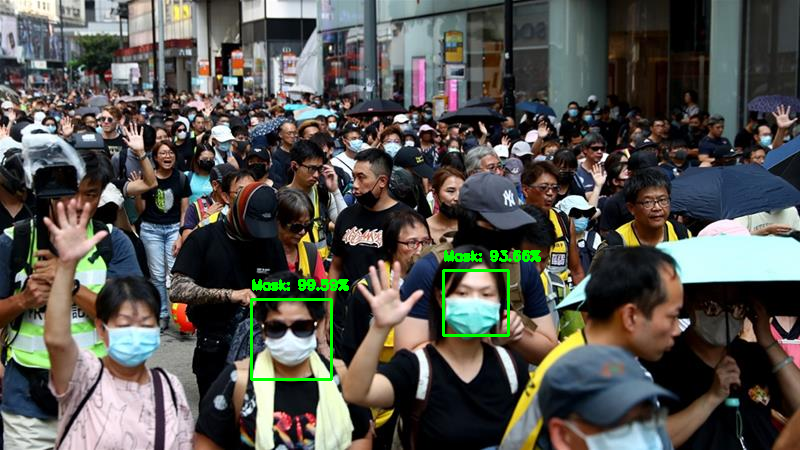

True

In [ ]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

frame = cv2.imread('/gdrive/My Drive/Another_mask/another mask image.jpg')

gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.3, 4)
print(faces.shape)

frame = haar_cascade(frame, faces)

cv2.imwrite('/gdrive/My Drive/Another_mask/sol1_haar_cascade.jpg', frame)

(3, 4)
199 196 36 36
No Mask: 99.85%
712 250 37 37
No Mask: 99.99%
544 296 31 31
No Mask: 99.26%


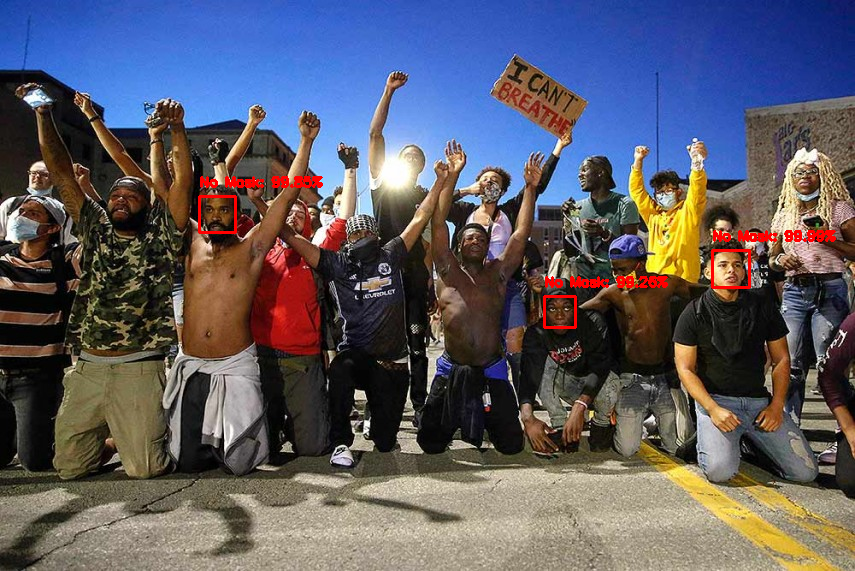

True

In [ ]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

frame = cv2.imread('/gdrive/My Drive/Another_mask/Protests_1_20200530_571_855.jpg')

gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.3, 3)
print(faces.shape)

frame = haar_cascade(frame, faces)

#cv2.imwrite('/gdrive/My Drive/Another_mask/sol2_haar_cascade.jpg', frame)

# MTCNN
https://github.com/ipazc/mtcnn

In [ ]:
!pip install mtcnn
from mtcnn.mtcnn import MTCNN

     |████████████████████████████████| 2.3MB 50kB/s 


Using TensorFlow backend.


In [ ]:
def detect_mtcnn(frame, result):
    for person in result:
        bounding_box = person['box']
        keypoints = person['keypoints']

        (x, y, w, h) = bounding_box
        face = frame[y:y+h, x:x+w]
        face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
        face = cv2.resize(face, (224, 224))
        face = img_to_array(face)
        face = preprocess_input(face)
        face = np.expand_dims(face, axis=0)

        # pass the face through the model to determine if the face
        # has a mask or not
        (mask, withoutMask) = model.predict(face)[0]

        # determine the class label and color we'll use to draw
        # the bounding box and text
        label = "Mask" if mask > withoutMask else "No Mask"
        color = (0, 255, 0) if label == "Mask" else (0, 0, 255)
        # include the probability in the label
        label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

        # display the label and bounding box rectangle on the output
        # frame
        cv2.putText(frame, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)
        cv2.rectangle(frame, (x, y), (x+w, y+h), color, 2)
        print(x, y, w, h)
        print(label)

    cv2_imshow(frame)
    return frame

11
636 188 31 39
No Mask: 75.32%
438 176 31 37
No Mask: 89.21%
157 145 16 22
No Mask: 85.30%
533 175 24 32
No Mask: 99.62%
446 266 49 67
Mask: 88.82%
589 143 13 17
Mask: 63.98%
265 304 48 56
Mask: 97.67%
298 157 26 31
No Mask: 99.19%
383 133 17 20
No Mask: 97.39%
99 113 13 16
No Mask: 70.75%
195 117 8 12
No Mask: 67.95%


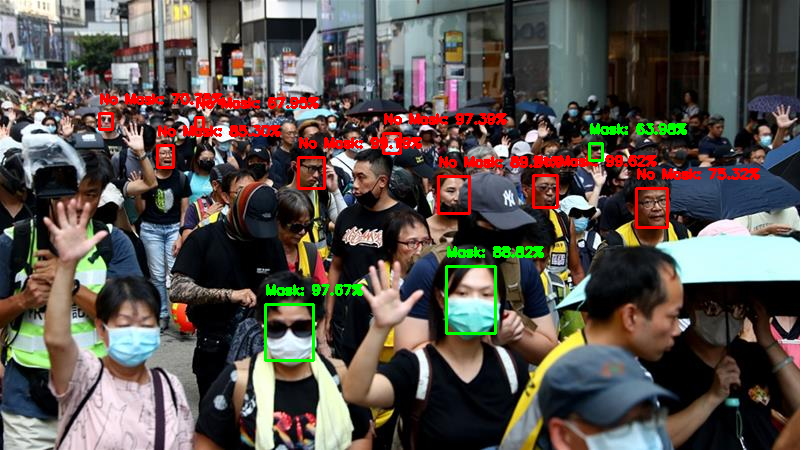

True

In [ ]:
detector = MTCNN(scale_factor = 0.71)

frame = cv2.imread('/gdrive/My Drive/Another_mask/another mask image.jpg')
#frame = cv2.imread('/gdrive/My Drive/Another_mask/Protests_1_20200530_571_855.jpg')
result = detector.detect_faces(frame)
print(len(result))
frame = detect_mtcnn(frame, result)
#cv2.imwrite('/gdrive/My Drive/Another_mask/sol1_mtcnn.jpg', frame)

5
713 254 27 32
No Mask: 99.12%
545 296 27 34
No Mask: 99.84%
793 164 23 26
No Mask: 99.04%
713 221 19 24
No Mask: 90.53%
463 230 21 26
No Mask: 89.96%


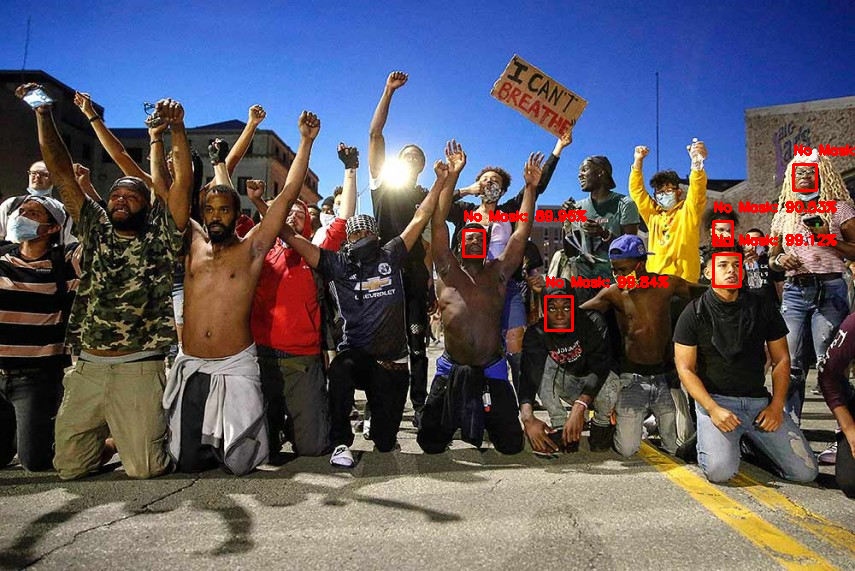

True

In [ ]:
detector = MTCNN(scale_factor = 0.71)

frame = cv2.imread('/gdrive/My Drive/Another_mask/Protests_1_20200530_571_855.jpg')

result = detector.detect_faces(frame)
print(len(result))
frame = detect_mtcnn(frame, result)
#cv2.imwrite('/gdrive/My Drive/Another_mask/sol2_mtcnn.jpg', frame)

# Applying all algorithm

In [ ]:
frame = '/gdrive/My Drive/Another_mask/another mask image.jpg'

image = face_recognition.load_image_file(frame)

face_locations = face_recognition.face_locations(image, model="cnn")

In [ ]:
# load the input image from disk, clone it, and grab the image spatial
# dimensions
image = cv2.imread('/gdrive/My Drive/Another_mask/another mask image.jpg')
orig = image.copy()
(h, w) = image.shape[:2]

# construct a blob from the image
blob = cv2.dnn.blobFromImage(image, 1.0, (300, 300), (104.0, 177.0, 123.0))

# pass the blob through the network and obtain the face detections
print("[INFO] computing face detections...")
net.setInput(blob)
detections = net.forward()
print(detections.shape)

[INFO] computing face detections...
(1, 1, 200, 7)


In [ ]:
detector = MTCNN(scale_factor = 0.71)

frame = cv2.imread('/gdrive/My Drive/Another_mask/another mask image.jpg')
#frame = cv2.imread('/gdrive/My Drive/Another_mask/Protests_1_20200530_571_855.jpg')
result = detector.detect_faces(frame)
print(len(result))

#frame = detect_mtcnn(frame, result)
#cv2.imwrite('/gdrive/My Drive/Another_mask/sol1_mtcnn.jpg', frame)

11


In [ ]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

frame = cv2.imread('/gdrive/My Drive/Another_mask/another mask image.jpg')

gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.3, 3)
print(faces.shape)

#frame = haar_cascade(frame, faces)

(2, 4)


443 270 65 65
Mask: 93.66%
251 299 80 80
Mask: 99.59%


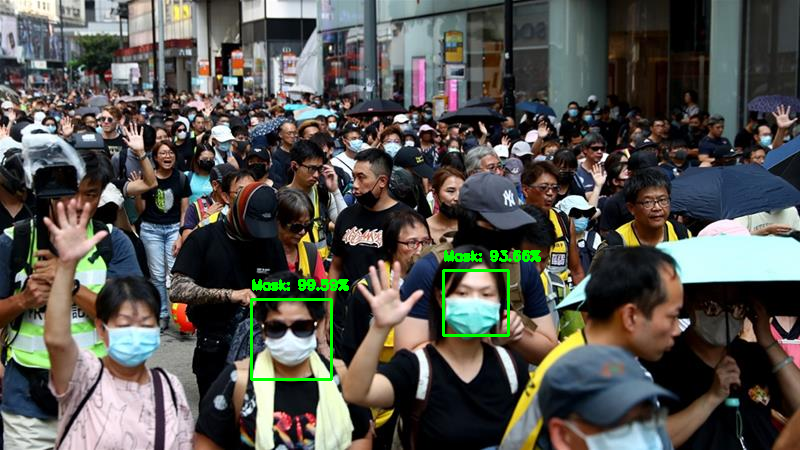

In [ ]:
frame = haar_cascade(frame, faces)

636 188 31 39
No Mask: 75.32%
438 176 31 37
No Mask: 89.21%
157 145 16 22
No Mask: 85.30%
533 175 24 32
No Mask: 99.62%
446 266 49 67
No Mask: 65.71%
589 143 13 17
Mask: 63.98%
265 304 48 56
Mask: 97.67%
298 157 26 31
No Mask: 99.19%
383 133 17 20
No Mask: 97.39%
99 113 13 16
No Mask: 70.75%
195 117 8 12
No Mask: 67.95%


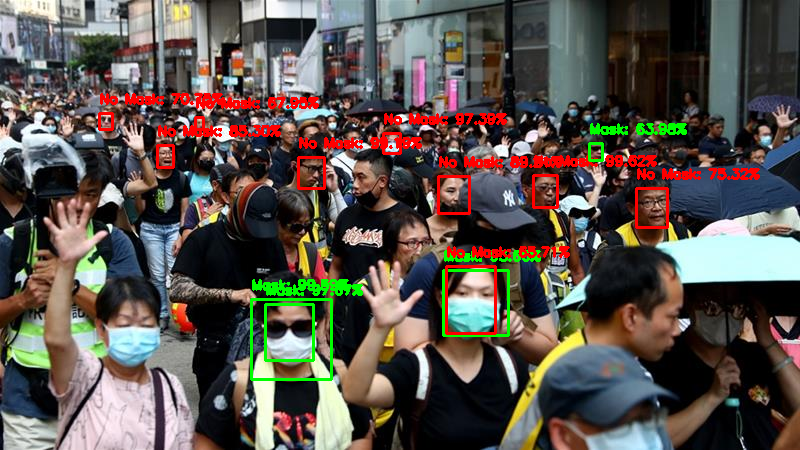

In [ ]:
frame = detect_mtcnn(frame, result)

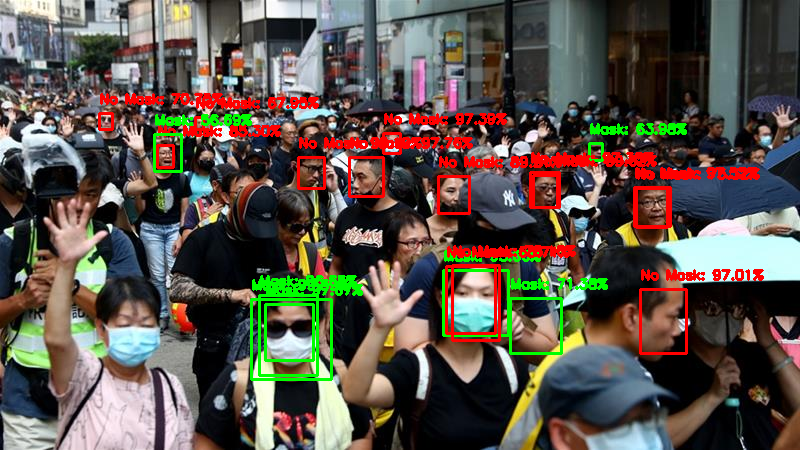

In [ ]:
frame = caffemodel(frame , detections)

I found 8 face(s) in this photograph.
No Mask: 99.03%
No Mask: 95.95%
No Mask: 97.55%
Mask: 96.11%
No Mask: 96.84%
Mask: 73.34%
No Mask: 99.77%
No Mask: 99.67%


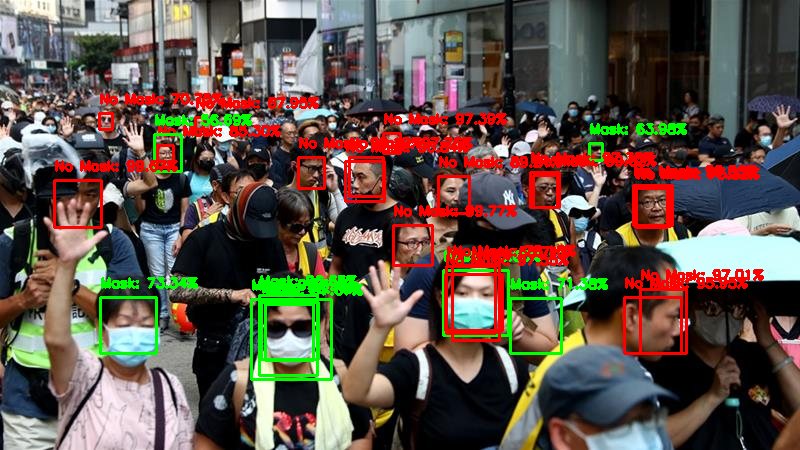

In [ ]:
frame = cv2.cvtColor(np.array(frame), cv2.COLOR_BGR2RGB)
frame_final = detect_dlib(frame, face_locations)

In [ ]:
cv2.imwrite('/gdrive/My Drive/Another_mask/sol1_frame_final.jpg', frame_final)

True

# Testing for second image

In [ ]:
frame = '/gdrive/My Drive/Another_mask/Protests_1_20200530_571_855.jpg'

image = face_recognition.load_image_file(frame)

face_locations = face_recognition.face_locations(image, model="cnn")


# load the input image from disk, clone it, and grab the image spatial
# dimensions
image = cv2.imread(frame)
orig = image.copy()
(h, w) = image.shape[:2]

# construct a blob from the image
blob = cv2.dnn.blobFromImage(image, 1.0, (300, 300), (104.0, 177.0, 123.0))

# pass the blob through the network and obtain the face detections
print("[INFO] computing face detections...")
net.setInput(blob)
detections = net.forward()
print(detections.shape)


detector = MTCNN(scale_factor = 0.71)
result = detector.detect_faces(image)
print(len(result))


face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.3, 3)
print(faces.shape)

[INFO] computing face detections...
(1, 1, 200, 7)
5
(3, 4)


199 196 36 36
No Mask: 99.85%
712 250 37 37
No Mask: 99.99%
544 296 31 31
No Mask: 99.26%


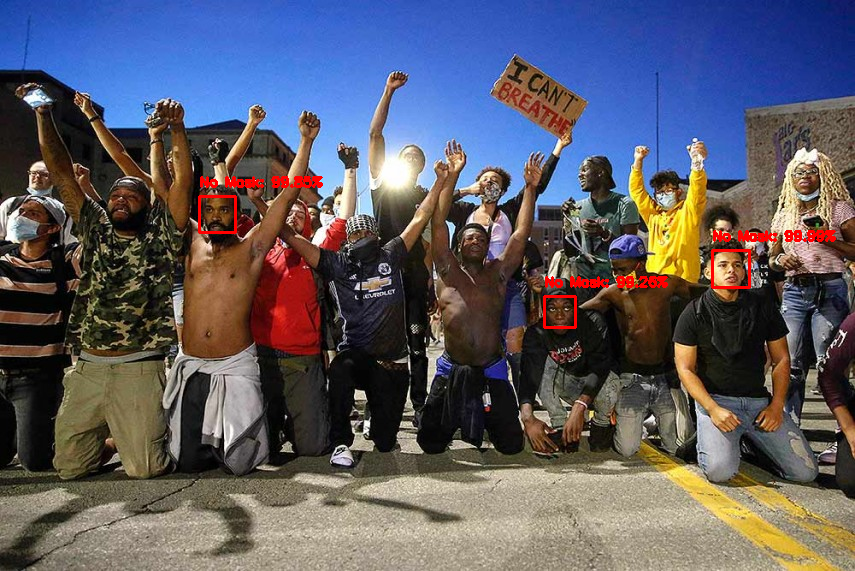

713 254 27 32
No Mask: 99.71%
545 296 27 34
No Mask: 92.30%
793 164 23 26
No Mask: 99.04%
713 221 19 24
No Mask: 95.78%
463 230 21 26
No Mask: 89.96%


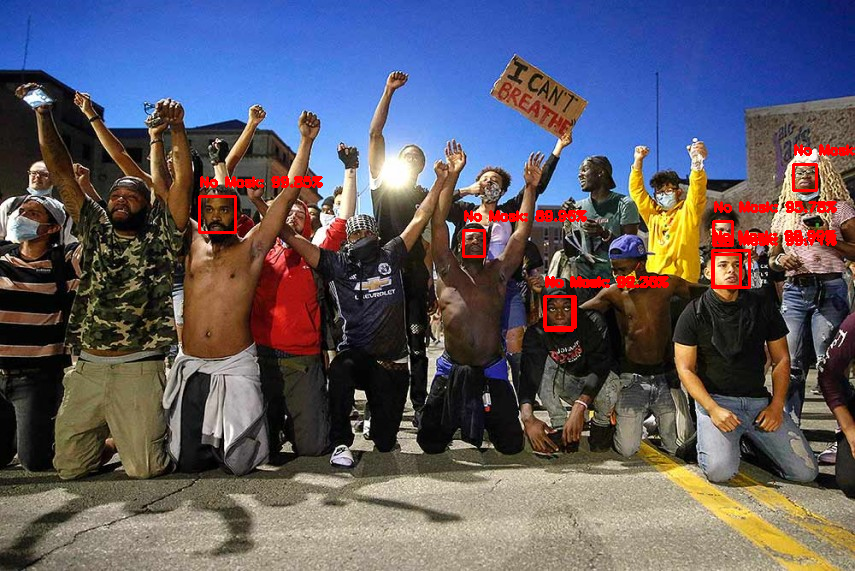

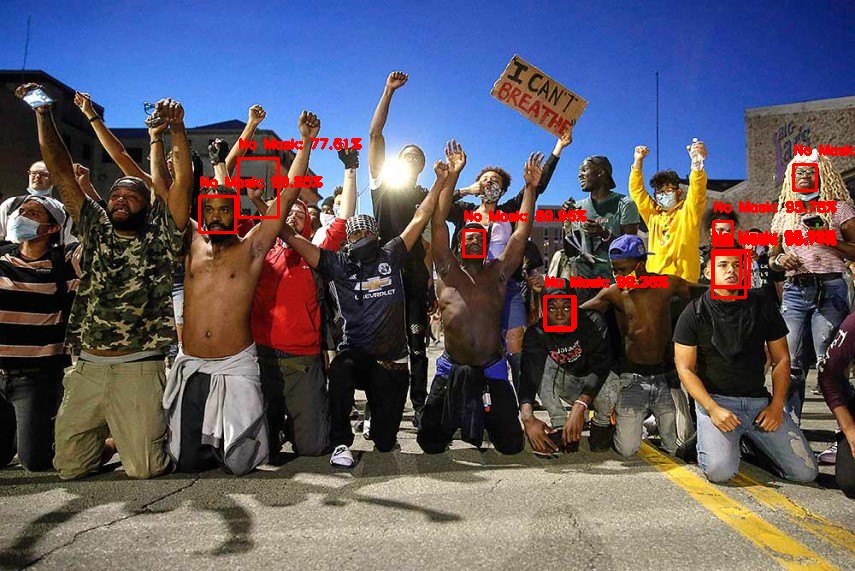

I found 3 face(s) in this photograph.
No Mask: 99.91%
No Mask: 96.78%
No Mask: 98.87%


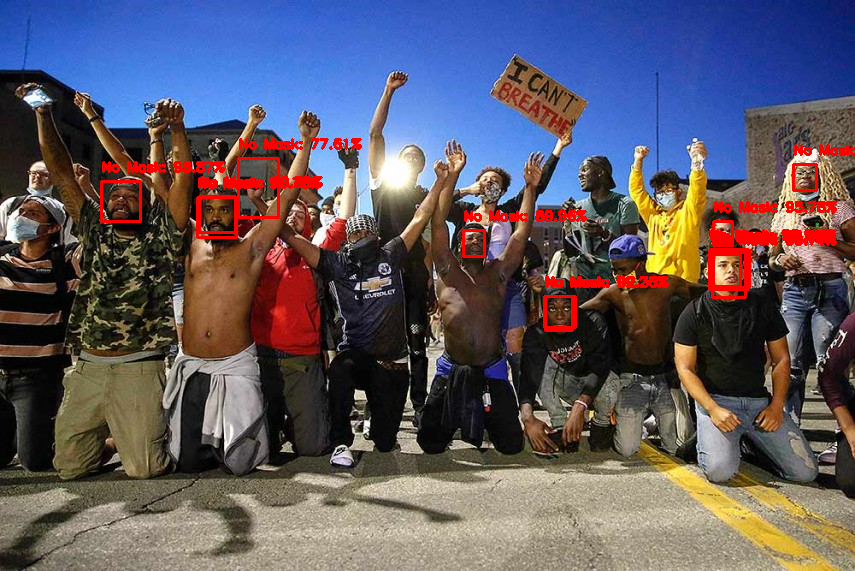

True

In [ ]:
frame = haar_cascade(image, faces)

frame = detect_mtcnn(frame, result)

frame = caffemodel(frame , detections)

frame = cv2.cvtColor(np.array(frame), cv2.COLOR_BGR2RGB)
frame_final = detect_dlib(frame, face_locations)

cv2.imwrite('/gdrive/My Drive/Another_mask/sol2_frame_final.jpg', frame_final)